<a href="https://colab.research.google.com/github/Guime7/visao-computacional-futsal-detector/blob/master/projeto-completo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Projeto de Visão Computacional UFABC
  ## Reconhecimento de jogadores em partidas de Futsal


**Alan Silva Barros RA:11079216**

**Guilherme Melo da Silva RA:112018100856**


**Desenvolvimento do modelo com base na API TensorFlow Lite Object Detection** de Evan Juras, disponível no `GitHub:` [TensorFlow Lite Object Detection](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi)



# Introdução



O modelo foi desenvolvido a partir da API [the TensorFlow 2 Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection) treinar um modelo utilizando um dataset customizado convertido para um formato compatível do TensorFlow Lite. BNa primeira parte do projeto, é possível criar e baixar um modelo TFLite para execução posterior,aplicável em diferentes plataformas como Android ou microcontroladores como Raspberry Pi.

<p align=center>
<img src="https://s3.us-west-1.amazonaws.com/evanjuras.com/img/CoinDetectorDemo.gif" height="360"><br>
<i>Exemplo de um modelo quando aplicado em vídeo ou tempo real</i>
</p>

# Instalação do TensorFlow Object Detection Dependencies

Configuração do ambiente para execução do tensorflow API

Versão mais recente e compatível com o projeto do TensorFlow: v2.8.0.



In [ ]:
# GitHub
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3931, done.
remote: Counting objects: 100% (3931/3931), done.
remote: Compressing objects: 100% (3041/3041), done.
remote: Total 3931 (delta 1142), reused 1899 (delta 836), pack-reused 0
Receiving objects: 100% (3931/3931), 49.68 MiB | 16.70 MiB/s, done.
Resolving deltas: 100% (1142/1142), done.
Updating files: 100% (3560/3560), done.


In [ ]:
# Arquivos de configuração  para a pasta models/research
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.


In [ ]:
# alteração do setup.py fpara usar TF v2.8.0
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:

    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.8.0', s)
    f.write(s)

In [ ]:
# Instalando Object Detection API
!pip install pyyaml==5.3
!pip install /content/models/research/

!pip install tensorflow==2.8.0

Execução de teste do model builder, para verificar se a instalação está correta

In [ ]:

!python /content/models/research/object_detection/builders/model_builder_tf2_test.py


# Dataset Preparation

`Pular caso já tenha um modelo pronto.`


Nessa etapa espera-se que já tenha disponível um dataset de imagens com o conjuto de arquivos XML de identificação dos objetos.

### 1° Opção - Clonar modelo e arquivos de imagens do github

Clonar para o ambiente do colab

In [ ]:
# Clone the tensorflow models repository from GitHub
!git clone --depth 1 https://github.com/Guime7/visao-computacional-futsal-detector.git

Cloning into 'visao-computacional-futsal-detector'...
remote: Enumerating objects: 175, done.
remote: Counting objects: 100% (175/175), done.
remote: Compressing objects: 100% (112/112), done.
remote: Total 175 (delta 61), reused 171 (delta 61), pack-reused 0
Receiving objects: 100% (175/175), 100.92 MiB | 16.45 MiB/s, done.
Resolving deltas: 100% (61/61), done.


In [ ]:
!mkdir /content/images
!mkdir /content/images/all
!cp /content/visao-computacional-futsal-detector/dataset/* /content/images/all
!mkdir /content/images/train; mkdir /content/images/validation; mkdir /content/images/test

### 2° Opção - Caso precise unzip pasta de images.zip

Pular em caso de utilização do clone do github


In [ ]:
!cp /content/gdrive/MyDrive/projeto-vc/images.zip /content

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!cp /content/gdrive/MyDrive/projeto-vc/images.zip /content

In [ ]:
!mkdir /content/images
!unzip -q /content/images.zip -d /content/images/all
!mkdir /content/images/train; mkdir /content/images/validation; mkdir /content/images/test

Imagens carregadas para uso como treino, validação e teste.

Arquivos de imagem e XML correspondentes compactados na pasta  `images.zip` ou se estiver clonando do github, imagens disponiveis na pasta `imagens`.

### Separação de imagens

*   **Train**: Imagens para treino do modelo e passadas para a rede neural.Usada para prever classes e posições dos objetos (neste caso, jogadores) da imagem.

*   **Validation**: Imagens para validação do algoritmo se  e verificar o progresso e assim ajustar "hyperparameters"


* **Test**: Imagens não utilizadas durante o treinamento. Reservadas para verificação através do usuário.


In [ ]:
!wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/train_val_test_split.py
!python train_val_test_split.py

--2023-08-08 11:24:38--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/train_val_test_split.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2803 (2.7K) [text/plain]
Saving to: ‘train_val_test_split.py.1’

train_val_test_spli 100%[===================>]   2.74K  --.-KB/s    in 0s      

2023-08-08 11:24:38 (48.0 MB/s) - ‘train_val_test_split.py.1’ saved [2803/2803]

Total images: 62
Images moving to train: 49
Images moving to validation: 6
Images moving to test: 7


# Treinamento do Modelo

`Pular caso já tenha um modelo pronto.`

Configuração da pipeline da rede neural e treinamento do modelo.

### Criação do Labelmap e TFRecords


In [ ]:
### Criando o "labelmap.txt" para listar as classes de objetos a serem detectados.
%%bash
cat <<EOF >> /content/labelmap.txt
person
ball
EOF

In [ ]:
# Scripts de conversão necessários para csv e para criar o tfrecord
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py

--2023-08-03 17:58:03--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1348 (1.3K) [text/plain]
Saving to: ‘create_csv.py’

create_csv.py       100%[===================>]   1.32K  --.-KB/s    in 0s      

2023-08-03 17:58:04 (94.4 MB/s) - ‘create_csv.py’ saved [1348/1348]

--2023-08-03 17:58:04--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githu

In [ ]:
# Criação do CSV e TFRecord
!python3 create_csv.py
!python3 create_tfrecord.py --csv_input=images/train_labels.csv --labelmap=labelmap.txt --image_dir=images/train --output_path=train.tfrecord
!python3 create_tfrecord.py --csv_input=images/validation_labels.csv --labelmap=labelmap.txt --image_dir=images/validation --output_path=val.tfrecord

Successfully converted xml to csv.
Successfully converted xml to csv.
Successfully created the TFRecords: /content/train.tfrecord
Successfully created the TFRecords: /content/val.tfrecord


In [ ]:
train_record_fname = '/content/train.tfrecord'
val_record_fname = '/content/val.tfrecord'
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

### Configuração do Treinamento

In [ ]:
# Definição do modelo escolhido pela variavel chosen_model
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },

}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

In [ ]:
# Criando pasta "mymodel" para os arquivos de configuração
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download de modelos de pré treino
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download dos arquivos de configuração de treino
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2023-08-03 17:58:17--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.12.128, 2404:6800:4003:c11::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.12.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  81.1MB/s    in 0.2s    

2023-08-03 17:58:17 (81.1 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2023-08-03 17:58:18--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 1

Pontos de configuração:

* **num_steps**: Numero de passos utilizados para treinar o modelo
* **batch_size**: Numero de imagens utilizadas por passo de treinamento


In [ ]:

num_steps = 50000

if chosen_model == 'efficientdet-d0':
  batch_size = 4
else:
  batch_size = 24

In [ ]:
# Definição dos locais de arquivos
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 2


In [ ]:
# Arquivo de configuração personalizado com dataset, checkpoints do modelo e parametros de treino
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # definindo o caminho fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # definindo os arquivos tfrecord para o treino e datasets de teste
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Definindo label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # definindo batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # definindo os training steps e num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # definindo o numero de classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # alterando o  "fine-tune" checkpoint de "classification" para "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    if chosen_model == 'efficientdet-d0':
      s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)


/content/models/mymodel
writing custom configuration file


In [ ]:
# Apresentando o conteudo do arquivo de configuração
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 2
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {

In [ ]:
# Definindo o local dos arquivos de configuração personalizados
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

### Executando treinamento modelo

Execução do treinamento e acompanhamento de métricas no tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

In [ ]:
# Trecho para rodar o treinamento
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrINS5_4

# Download do Modelo

`Pular caso já tenha um modelo pronto.`

Conversão do modelo para o TensorFlow Lite.
Realiza a criação de uma pasta, copia dos objetos e download do modelo em formato de tensorflow lite para o computador.

In [ ]:
# Criando pasta
!mkdir /content/custom_model_lite
output_directory = '/content/custom_model_lite'

# Path to training directory (the conversion script automatically chooses the highest checkpoint file)
last_model_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}


In [ ]:
# Convert exported graph file into TFLite model file
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
# Copiar arquivos importante do modelo para a pasta.
!cp /content/labelmap.txt /content/custom_model_lite
!cp /content/labelmap.pbtxt /content/custom_model_lite
!cp /content/models/mymodel/pipeline_file.config /content/custom_model_lite

%cd /content
!zip -r custom_model_lite.zip custom_model_lite

In [ ]:
# Download do arquivo
from google.colab import files

files.download('/content/custom_model_lite.zip')

#  Validação do Modelo

`Para testar um modelo já pronto altere as configuração de Path para apontar ao novo modelo.`

Teste do modelo para um conjuto de imagens.

### Clonar modelo e arquivos de imagens do github

Clonar para o ambiente do colab, caso ainda não tenha sido clonado em passsos anteriores.

In [ ]:
# Clone the tensorflow models repository from GitHub
!git clone --depth 1 https://github.com/Guime7/visao-computacional-futsal-detector.git

fatal: destination path 'visao-computacional-futsal-detector' already exists and is not an empty directory.


### Execução do Modelo

In [ ]:
# Parametros para execução. Apontar para o modelo desejado para testar.
PATH_TO_IMAGES='/content/visao-computacional-futsal-detector/images'   # Path to test images folder
PATH_TO_MODEL='/content/visao-computacional-futsal-detector/models/custom_model_lite-v2/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/visao-computacional-futsal-detector/models/custom_model_lite-v2/labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold=0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   # Number of images to run detection on


In [ ]:
# Script para rodar o modelo TFLite para a detecção do sobjetos (jogadores em campo)
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Definição da função de inferencia e exibição de resultados

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # pega o nome dos arquivos presents na pasta de teste
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # carrega na memoria o label map
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # carrega o modelo Tensorflow Lite na memória
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # pega os detalhes do modelo
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # seleciona de maneira aleatória as imagens para o teste
  images_to_test = random.sample(images, num_test_images)

  # Loop para cada imagem e rodando a detecção nelas
  for image_path in images_to_test:

      # carrega a imagem e redefine pro formato esperado [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # normalização dos valores dos pixels
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

    # Executando a detecção com a imagem como entrada no modelo
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Devolver os resultados da detecção
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Coordenadas da caixa dos objetos detectados
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # index da classe dos objetos detectados
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # percentual de confiança dos objetos detectados

      detections = []

      # desenha a caixa de detecção para os casos que o grau de confiança ultrapassa o limite minimo
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # pegando as coordenadas da caixa e desenhando
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # desenhando o rótulo (label)
              object_name = labels[int(classes[i])]
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # valor e rotulo a ser desenhado, por exemplo: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # tamanho da fonte
              label_ymin = max(ymin, labelSize[1] + 10) # distanciamento minimo pra borda superior da iamgem
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # desenhando a caxa do rotulo
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # desenhando o texto do rotulo

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # Exibição da iamgem
      if txt_only == False:
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # salvando os resultados de detecçao em arquivos .txt
      elif txt_only == True:

        # consultando nome dos arquivos e seus caminhos
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # escrevendo os resultados nos arquivos de texto
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

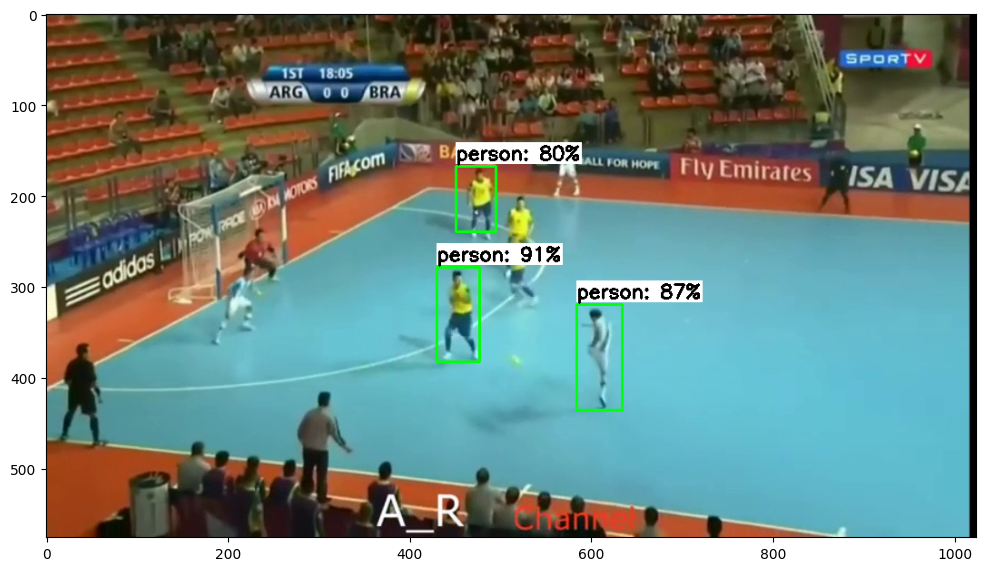

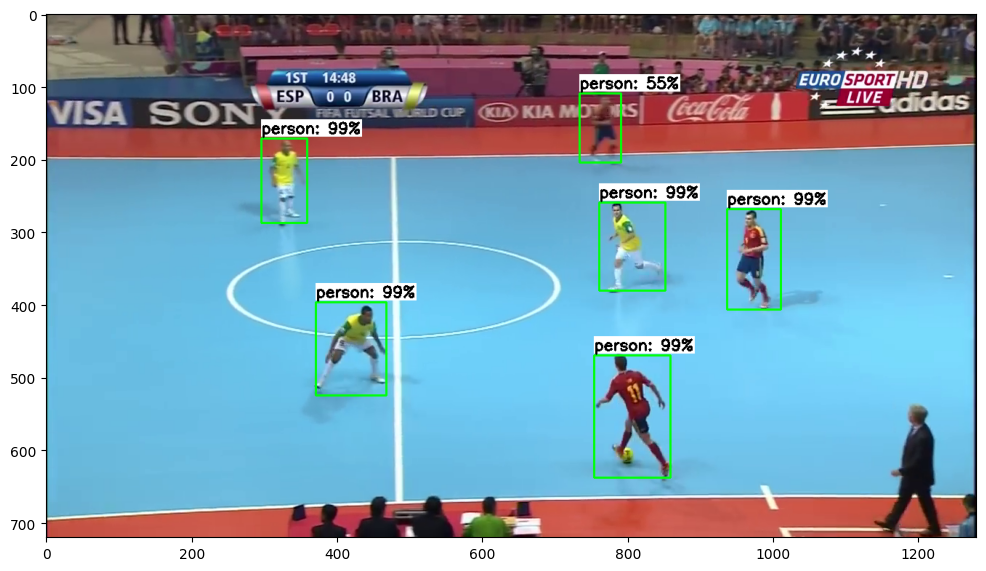

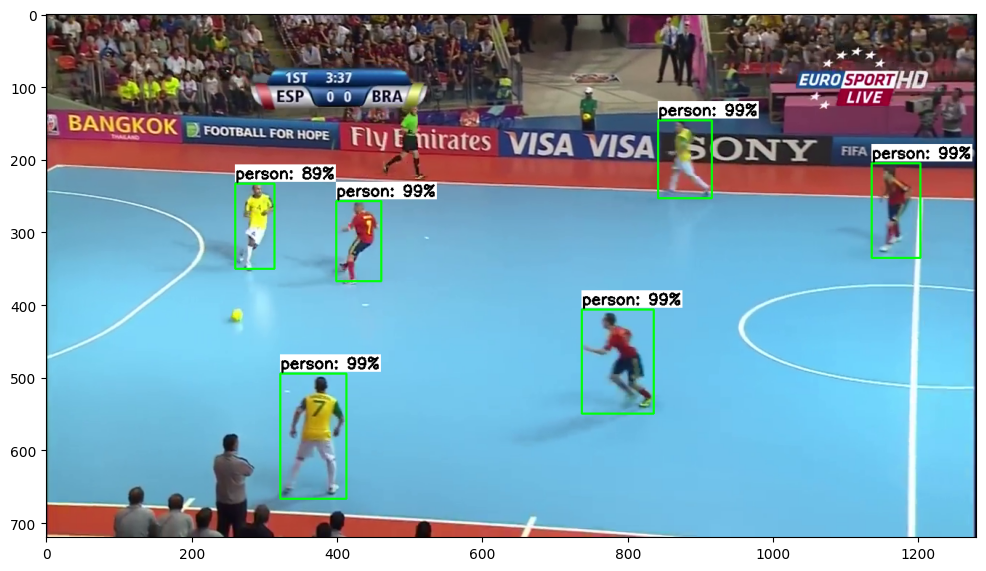

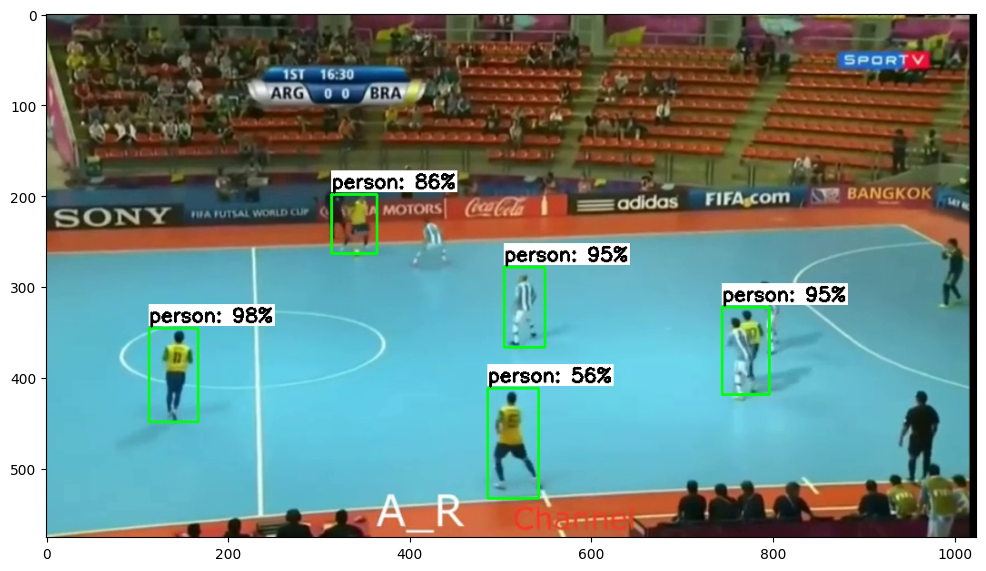

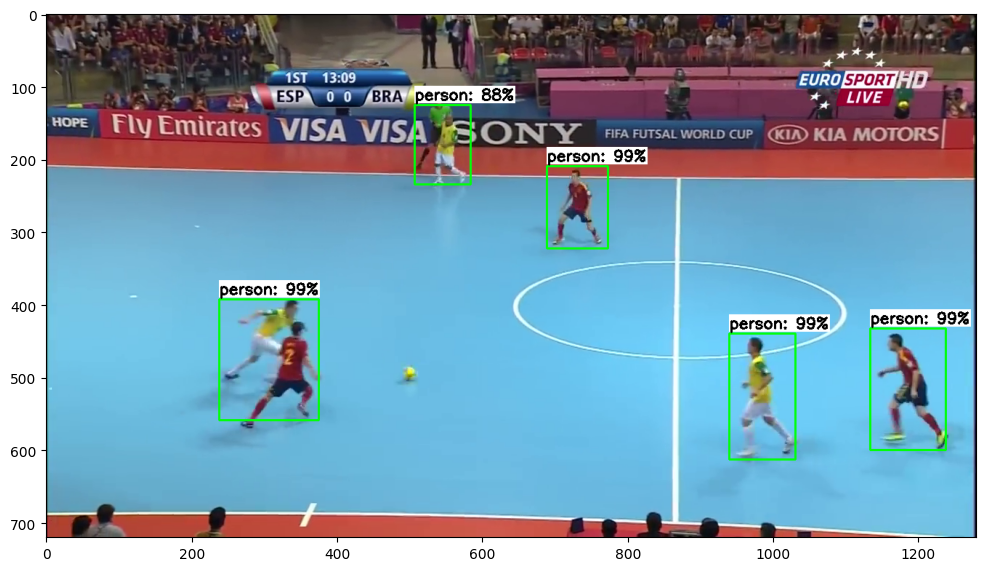

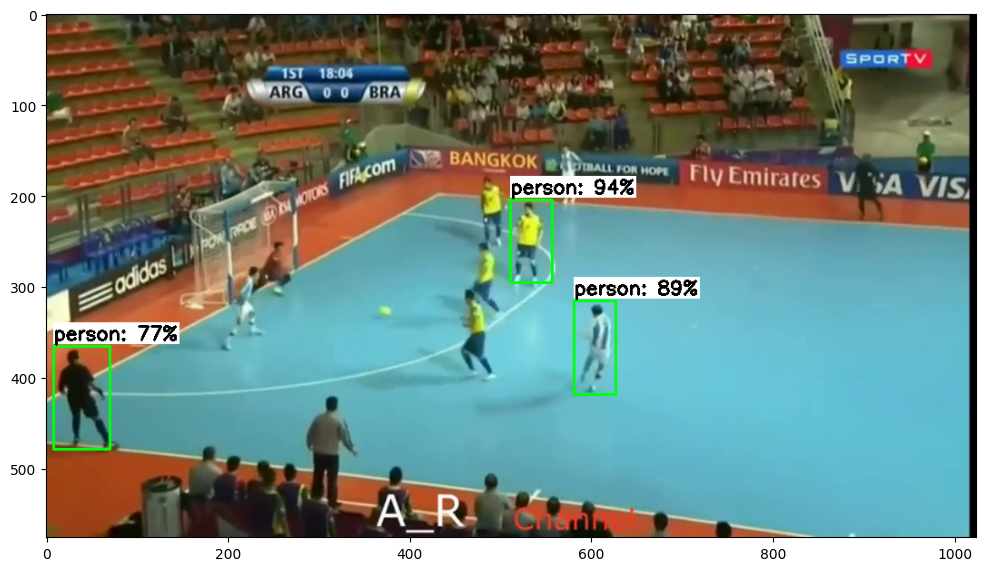

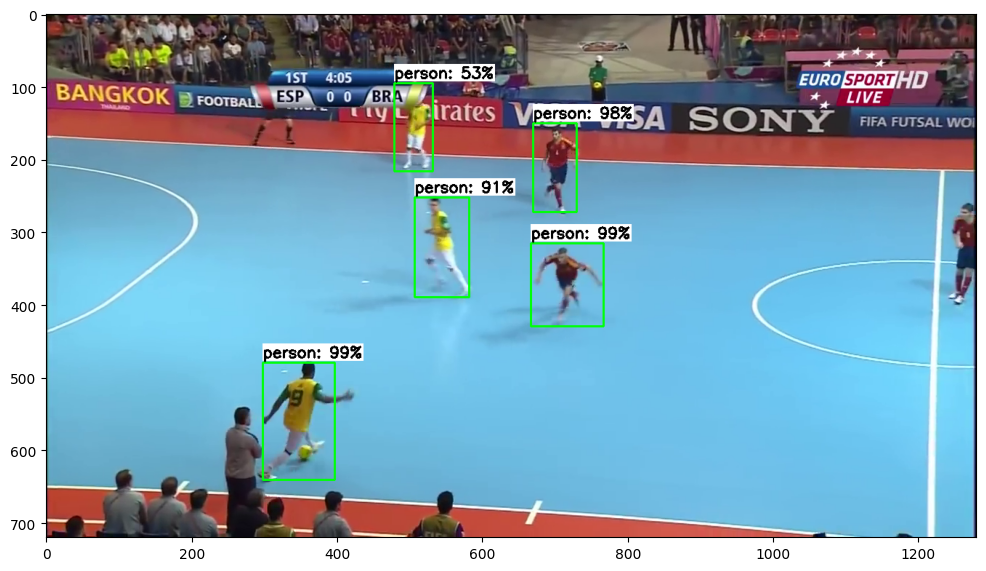

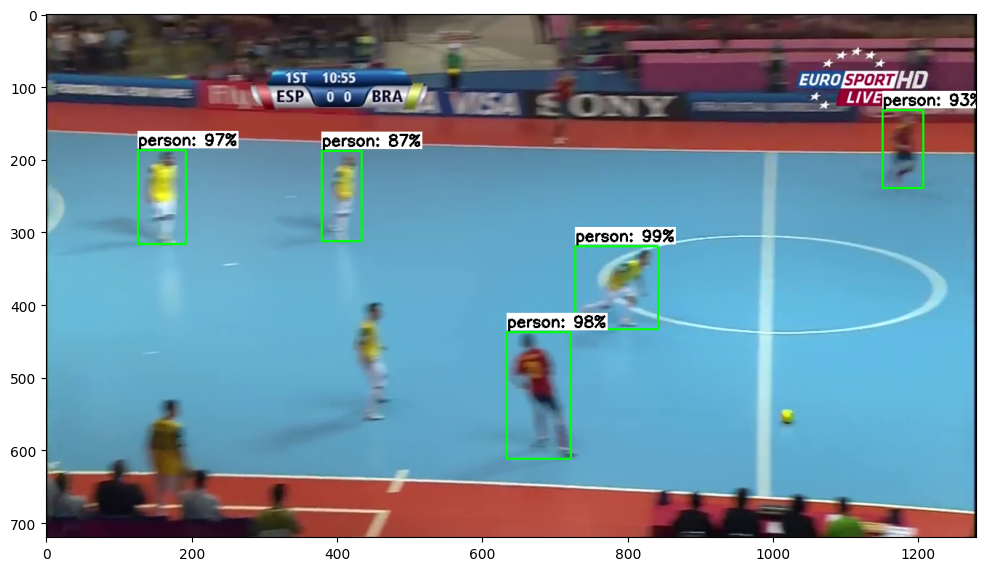

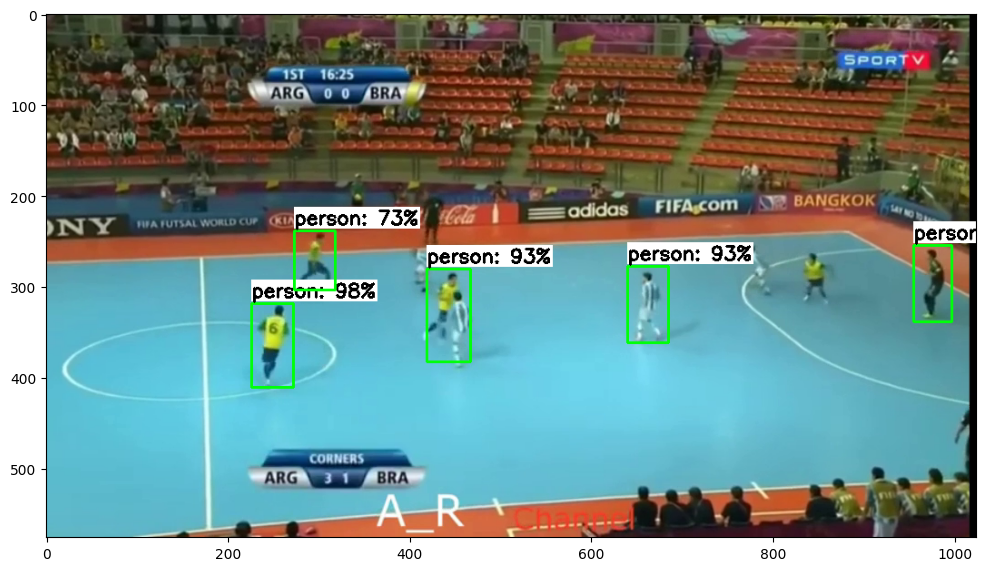

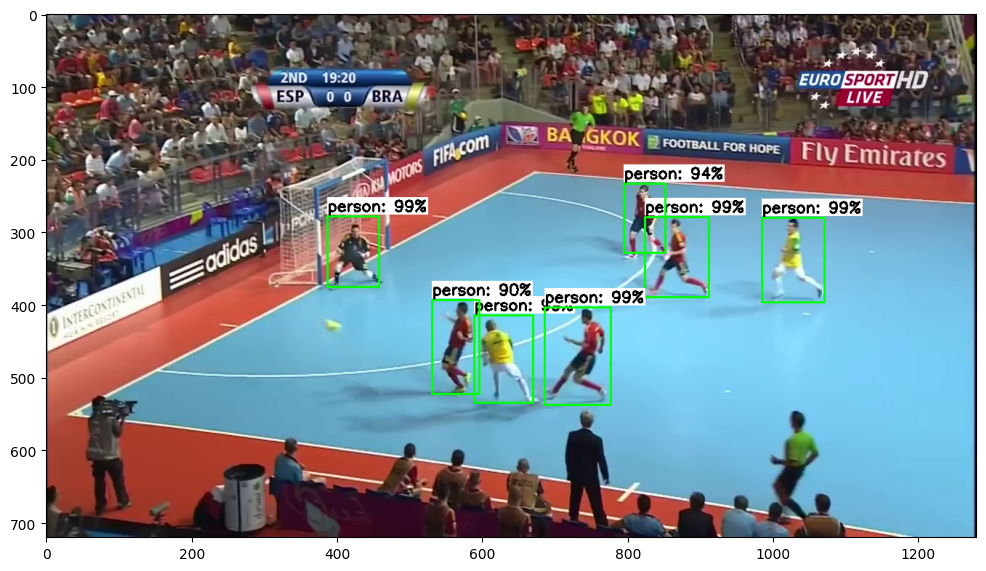

In [ ]:
# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

### Cálculo do mAP - Mean Average Precision


In [ ]:
%%bash
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/*
rm input/ground-truth/*
rm input/images-optional/*
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

Cloning into '/content/mAP'...
--2023-08-08 02:48:11--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py’

     0K .....                                                 100% 61.8M=0s

2023-08-08 02:48:12 (61.8 MB/s) - ‘calculate_map_cartucho.py’ saved [5397/5397]



In [ ]:
!cp /content/visao-computacional-futsal-detector/dataset/* /content/mAP/input/images-optional # Copy images and xml files
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Move xml files to the appropriate folder

In [ ]:
!python /content/mAP/scripts/extra/convert_gt_xml.py

Conversion completed!


In [ ]:
# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/visao-computacional-futsal-detector/dataset'   # Path to test images folder
PATH_TO_MODEL='/content/visao-computacional-futsal-detector/models/custom_model_lite-v2/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/visao-computacional-futsal-detector/models/custom_model_lite-v2/labelmap.txt'   # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Starting inference on 62 images...
Finished inferencing!


In [ ]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/visao-computacional-futsal-detector/models/custom_model_lite-v2/labelmap.txt

/content/mAP
Calculating mAP at 0.50 IoU threshold...
60.07% = ball AP 
97.47% = person AP 
mAP = 78.77%
Calculating mAP at 0.55 IoU threshold...
55.45% = ball AP 
95.39% = person AP 
mAP = 75.42%
Calculating mAP at 0.60 IoU threshold...
44.26% = ball AP 
94.89% = person AP 
mAP = 69.58%
Calculating mAP at 0.65 IoU threshold...
35.25% = ball AP 
94.39% = person AP 
mAP = 64.82%
Calculating mAP at 0.70 IoU threshold...
25.65% = ball AP 
92.90% = person AP 
mAP = 59.28%
Calculating mAP at 0.75 IoU threshold...
9.95% = ball AP 
84.96% = person AP 
mAP = 47.45%
Calculating mAP at 0.80 IoU threshold...
4.16% = ball AP 
76.61% = person AP 
mAP = 40.39%
Calculating mAP at 0.85 IoU threshold...
2.29% = ball AP 
63.89% = person AP 
mAP = 33.09%
Calculating mAP at 0.90 IoU threshold...
1.04% = ball AP 
30.05% = person AP 
mAP = 15.54%
Calculating mAP at 0.95 IoU threshold...
0.46% = ball AP 
1.57% = person AP 
mAP = 1.01%

***mAP Results***

Class		Average mAP @ 0.5:0.95
------------------------

Idealmente o score reportado no final deve ser maior qu 50% (0.50). Caso não seja atulizar o dataset com mais imagens e treinar novamente o modelo.